# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

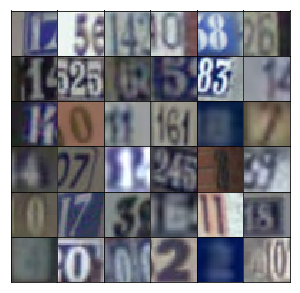

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [10]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [11]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [12]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [13]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [14]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [15]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [ ]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 25
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 1.2497... Generator Loss: 0.6906
Epoch 1/25... Discriminator Loss: 0.3660... Generator Loss: 1.9392
Epoch 1/25... Discriminator Loss: 0.1758... Generator Loss: 2.4167
Epoch 1/25... Discriminator Loss: 0.1409... Generator Loss: 2.7840
Epoch 1/25... Discriminator Loss: 0.1425... Generator Loss: 3.1425
Epoch 1/25... Discriminator Loss: 0.0814... Generator Loss: 3.3771
Epoch 1/25... Discriminator Loss: 0.1301... Generator Loss: 2.6979
Epoch 1/25... Discriminator Loss: 0.1644... Generator Loss: 2.7818
Epoch 1/25... Discriminator Loss: 0.1413... Generator Loss: 3.0343
Epoch 1/25... Discriminator Loss: 0.1547... Generator Loss: 2.4345


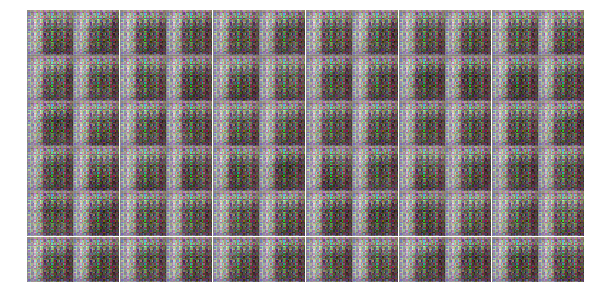

Epoch 1/25... Discriminator Loss: 0.1150... Generator Loss: 3.4459
Epoch 1/25... Discriminator Loss: 0.4775... Generator Loss: 2.8642
Epoch 1/25... Discriminator Loss: 0.7769... Generator Loss: 2.9031
Epoch 1/25... Discriminator Loss: 0.6191... Generator Loss: 1.3334
Epoch 1/25... Discriminator Loss: 0.6517... Generator Loss: 2.0711
Epoch 1/25... Discriminator Loss: 0.4177... Generator Loss: 1.8889
Epoch 1/25... Discriminator Loss: 0.6461... Generator Loss: 3.1834
Epoch 1/25... Discriminator Loss: 0.4620... Generator Loss: 1.7447
Epoch 1/25... Discriminator Loss: 0.7494... Generator Loss: 1.7525
Epoch 1/25... Discriminator Loss: 0.1507... Generator Loss: 2.6739


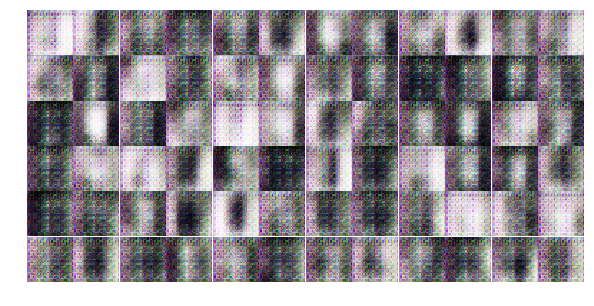

Epoch 1/25... Discriminator Loss: 0.4830... Generator Loss: 1.8528
Epoch 1/25... Discriminator Loss: 0.2315... Generator Loss: 3.1112
Epoch 1/25... Discriminator Loss: 1.1593... Generator Loss: 0.8306
Epoch 1/25... Discriminator Loss: 0.4563... Generator Loss: 3.1292
Epoch 1/25... Discriminator Loss: 0.4176... Generator Loss: 2.6542
Epoch 1/25... Discriminator Loss: 0.8608... Generator Loss: 2.9369
Epoch 1/25... Discriminator Loss: 0.8817... Generator Loss: 0.9515
Epoch 1/25... Discriminator Loss: 0.2829... Generator Loss: 2.3726
Epoch 1/25... Discriminator Loss: 0.6652... Generator Loss: 2.3036
Epoch 1/25... Discriminator Loss: 0.3557... Generator Loss: 2.1687


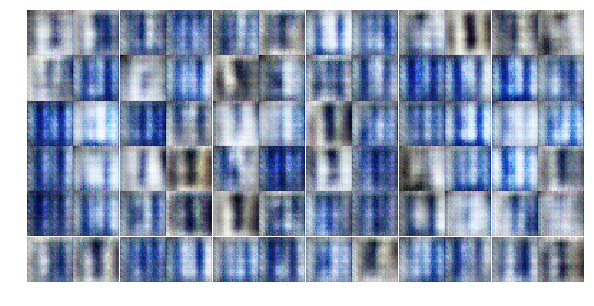

Epoch 1/25... Discriminator Loss: 1.5366... Generator Loss: 1.1647
Epoch 1/25... Discriminator Loss: 0.5890... Generator Loss: 1.7596
Epoch 1/25... Discriminator Loss: 0.5722... Generator Loss: 1.9016
Epoch 1/25... Discriminator Loss: 0.3930... Generator Loss: 2.6287
Epoch 1/25... Discriminator Loss: 4.3958... Generator Loss: 8.1545
Epoch 1/25... Discriminator Loss: 0.6905... Generator Loss: 1.5143
Epoch 1/25... Discriminator Loss: 0.6220... Generator Loss: 1.3044
Epoch 1/25... Discriminator Loss: 0.6933... Generator Loss: 1.4771
Epoch 1/25... Discriminator Loss: 0.7668... Generator Loss: 1.8153
Epoch 1/25... Discriminator Loss: 0.6927... Generator Loss: 1.4133


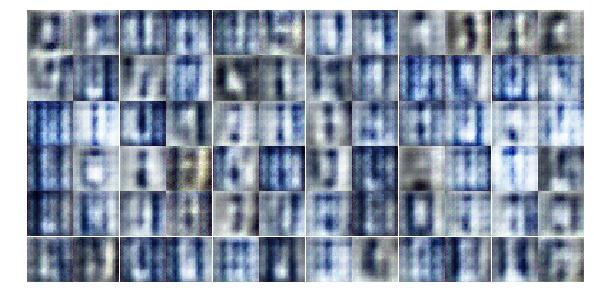

Epoch 1/25... Discriminator Loss: 0.5143... Generator Loss: 1.6396
Epoch 1/25... Discriminator Loss: 0.4463... Generator Loss: 2.1123
Epoch 1/25... Discriminator Loss: 0.5454... Generator Loss: 1.5881
Epoch 1/25... Discriminator Loss: 0.2987... Generator Loss: 2.8490
Epoch 1/25... Discriminator Loss: 0.4119... Generator Loss: 2.0886
Epoch 1/25... Discriminator Loss: 0.5563... Generator Loss: 1.2939
Epoch 1/25... Discriminator Loss: 0.3296... Generator Loss: 1.8634
Epoch 1/25... Discriminator Loss: 0.2073... Generator Loss: 3.1666
Epoch 1/25... Discriminator Loss: 0.6960... Generator Loss: 0.9989
Epoch 1/25... Discriminator Loss: 0.3255... Generator Loss: 2.0033


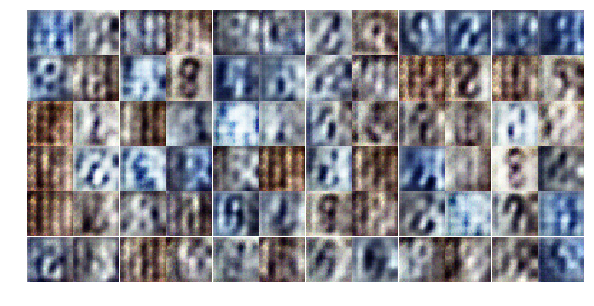

Epoch 1/25... Discriminator Loss: 0.2676... Generator Loss: 2.2073
Epoch 1/25... Discriminator Loss: 1.5895... Generator Loss: 4.5544
Epoch 1/25... Discriminator Loss: 1.5091... Generator Loss: 3.7283
Epoch 1/25... Discriminator Loss: 1.4105... Generator Loss: 0.4455
Epoch 1/25... Discriminator Loss: 0.7772... Generator Loss: 1.2157
Epoch 1/25... Discriminator Loss: 0.8249... Generator Loss: 1.2284
Epoch 1/25... Discriminator Loss: 0.4609... Generator Loss: 2.3847
Epoch 2/25... Discriminator Loss: 0.9884... Generator Loss: 1.1869
Epoch 2/25... Discriminator Loss: 0.6647... Generator Loss: 1.3627
Epoch 2/25... Discriminator Loss: 1.4119... Generator Loss: 0.5350


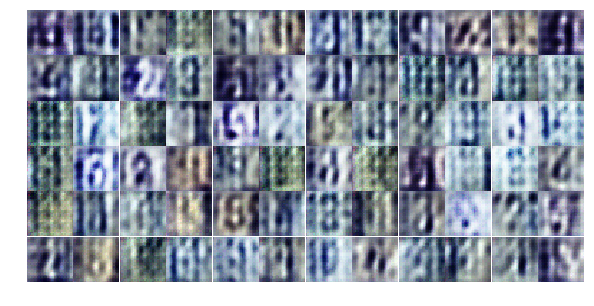

Epoch 2/25... Discriminator Loss: 0.4430... Generator Loss: 1.9277
Epoch 2/25... Discriminator Loss: 0.7195... Generator Loss: 1.0271
Epoch 2/25... Discriminator Loss: 1.1837... Generator Loss: 0.5592
Epoch 2/25... Discriminator Loss: 0.4963... Generator Loss: 2.8834
Epoch 2/25... Discriminator Loss: 1.5736... Generator Loss: 0.3257
Epoch 2/25... Discriminator Loss: 1.4131... Generator Loss: 0.4861
Epoch 2/25... Discriminator Loss: 1.5066... Generator Loss: 0.7284
Epoch 2/25... Discriminator Loss: 0.4405... Generator Loss: 1.9859
Epoch 2/25... Discriminator Loss: 0.3268... Generator Loss: 2.7515
Epoch 2/25... Discriminator Loss: 0.7434... Generator Loss: 1.3837


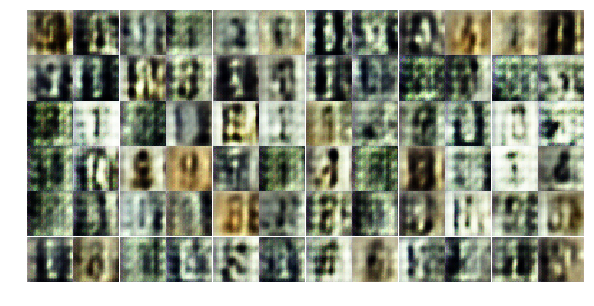

Epoch 2/25... Discriminator Loss: 0.7306... Generator Loss: 2.1503
Epoch 2/25... Discriminator Loss: 0.9413... Generator Loss: 0.9808
Epoch 2/25... Discriminator Loss: 0.4593... Generator Loss: 1.8789
Epoch 2/25... Discriminator Loss: 1.0222... Generator Loss: 0.8142
Epoch 2/25... Discriminator Loss: 0.7296... Generator Loss: 2.0520
Epoch 2/25... Discriminator Loss: 1.0459... Generator Loss: 0.7423
Epoch 2/25... Discriminator Loss: 1.1192... Generator Loss: 3.9141
Epoch 2/25... Discriminator Loss: 0.5824... Generator Loss: 1.4089
Epoch 2/25... Discriminator Loss: 0.6470... Generator Loss: 1.3388
Epoch 2/25... Discriminator Loss: 1.0610... Generator Loss: 0.7111


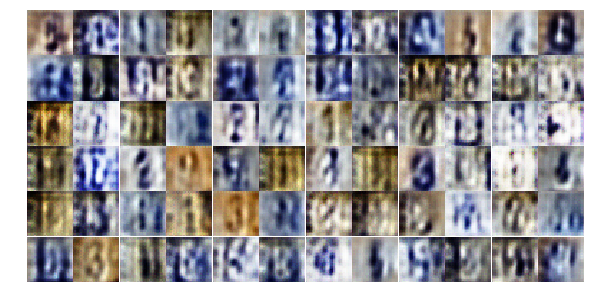

Epoch 2/25... Discriminator Loss: 0.5764... Generator Loss: 2.1725
Epoch 2/25... Discriminator Loss: 0.6281... Generator Loss: 1.2582
Epoch 2/25... Discriminator Loss: 1.0783... Generator Loss: 0.6460
Epoch 2/25... Discriminator Loss: 1.0717... Generator Loss: 1.0721
Epoch 2/25... Discriminator Loss: 0.6694... Generator Loss: 1.1306
Epoch 2/25... Discriminator Loss: 0.8191... Generator Loss: 0.9207
Epoch 2/25... Discriminator Loss: 0.6883... Generator Loss: 0.8982
Epoch 2/25... Discriminator Loss: 0.5233... Generator Loss: 2.1320
Epoch 2/25... Discriminator Loss: 1.8214... Generator Loss: 0.2413
Epoch 2/25... Discriminator Loss: 0.6787... Generator Loss: 1.4925


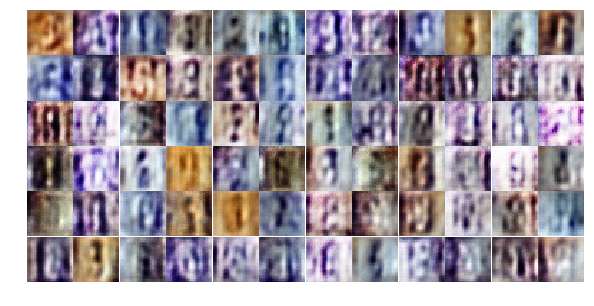

Epoch 2/25... Discriminator Loss: 0.4385... Generator Loss: 1.6354
Epoch 2/25... Discriminator Loss: 1.3001... Generator Loss: 1.9980
Epoch 2/25... Discriminator Loss: 1.9627... Generator Loss: 0.2304
Epoch 2/25... Discriminator Loss: 0.8221... Generator Loss: 1.4709
Epoch 2/25... Discriminator Loss: 1.0747... Generator Loss: 1.5499
Epoch 2/25... Discriminator Loss: 0.9426... Generator Loss: 4.6493
Epoch 2/25... Discriminator Loss: 0.6629... Generator Loss: 1.6034
Epoch 2/25... Discriminator Loss: 0.4397... Generator Loss: 2.7031
Epoch 2/25... Discriminator Loss: 0.5482... Generator Loss: 2.2956
Epoch 2/25... Discriminator Loss: 0.6371... Generator Loss: 2.1846


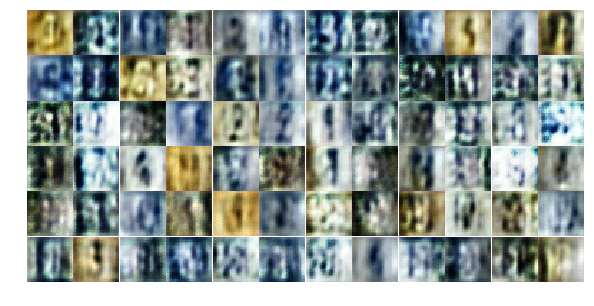

Epoch 2/25... Discriminator Loss: 0.3357... Generator Loss: 1.7997
Epoch 2/25... Discriminator Loss: 0.9839... Generator Loss: 2.3440
Epoch 2/25... Discriminator Loss: 0.5276... Generator Loss: 1.4113
Epoch 2/25... Discriminator Loss: 1.7328... Generator Loss: 0.2831
Epoch 2/25... Discriminator Loss: 0.5636... Generator Loss: 2.0329
Epoch 2/25... Discriminator Loss: 1.4577... Generator Loss: 0.4255
Epoch 2/25... Discriminator Loss: 0.4374... Generator Loss: 3.7172
Epoch 2/25... Discriminator Loss: 0.9267... Generator Loss: 3.1447
Epoch 2/25... Discriminator Loss: 0.2154... Generator Loss: 3.1320
Epoch 2/25... Discriminator Loss: 1.6132... Generator Loss: 4.4306


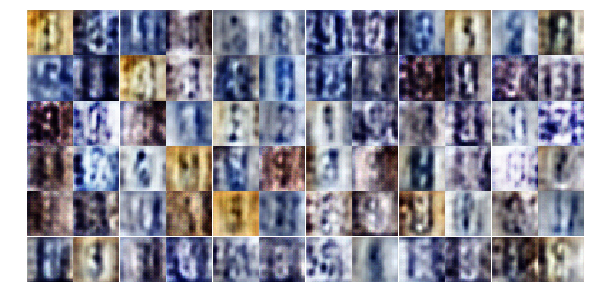

Epoch 2/25... Discriminator Loss: 0.7884... Generator Loss: 1.1077
Epoch 2/25... Discriminator Loss: 0.6447... Generator Loss: 3.0003
Epoch 2/25... Discriminator Loss: 2.0789... Generator Loss: 0.1760
Epoch 2/25... Discriminator Loss: 1.2331... Generator Loss: 0.4929
Epoch 3/25... Discriminator Loss: 0.2687... Generator Loss: 3.0003
Epoch 3/25... Discriminator Loss: 0.3689... Generator Loss: 1.8776
Epoch 3/25... Discriminator Loss: 0.4162... Generator Loss: 2.2196
Epoch 3/25... Discriminator Loss: 1.4317... Generator Loss: 0.3654
Epoch 3/25... Discriminator Loss: 0.5694... Generator Loss: 1.9353
Epoch 3/25... Discriminator Loss: 1.0180... Generator Loss: 0.6945


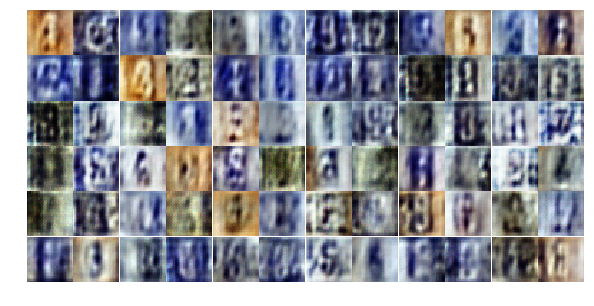

Epoch 3/25... Discriminator Loss: 1.7882... Generator Loss: 0.2501
Epoch 3/25... Discriminator Loss: 0.4051... Generator Loss: 1.8766
Epoch 3/25... Discriminator Loss: 1.5836... Generator Loss: 0.3115
Epoch 3/25... Discriminator Loss: 0.5545... Generator Loss: 1.2012
Epoch 3/25... Discriminator Loss: 1.9267... Generator Loss: 0.1825
Epoch 3/25... Discriminator Loss: 0.6695... Generator Loss: 1.1951
Epoch 3/25... Discriminator Loss: 0.7313... Generator Loss: 0.9066
Epoch 3/25... Discriminator Loss: 0.5895... Generator Loss: 1.1539
Epoch 3/25... Discriminator Loss: 0.5255... Generator Loss: 1.2058
Epoch 3/25... Discriminator Loss: 1.5220... Generator Loss: 0.3137


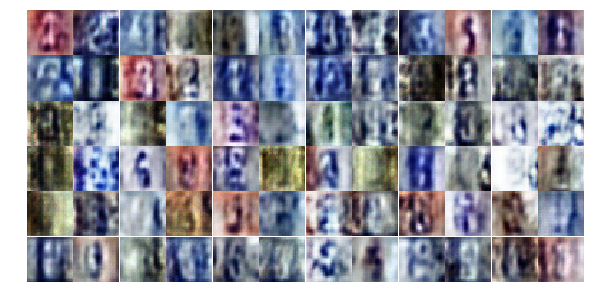

Epoch 3/25... Discriminator Loss: 0.4543... Generator Loss: 4.9049
Epoch 3/25... Discriminator Loss: 1.0015... Generator Loss: 0.6304
Epoch 3/25... Discriminator Loss: 0.9248... Generator Loss: 0.6375
Epoch 3/25... Discriminator Loss: 1.0673... Generator Loss: 0.6054
Epoch 3/25... Discriminator Loss: 0.4417... Generator Loss: 1.3482
Epoch 3/25... Discriminator Loss: 0.7163... Generator Loss: 0.9157
Epoch 3/25... Discriminator Loss: 1.6293... Generator Loss: 0.3240
Epoch 3/25... Discriminator Loss: 0.7811... Generator Loss: 3.6168
Epoch 3/25... Discriminator Loss: 0.9828... Generator Loss: 7.1461
Epoch 3/25... Discriminator Loss: 0.6624... Generator Loss: 1.0227


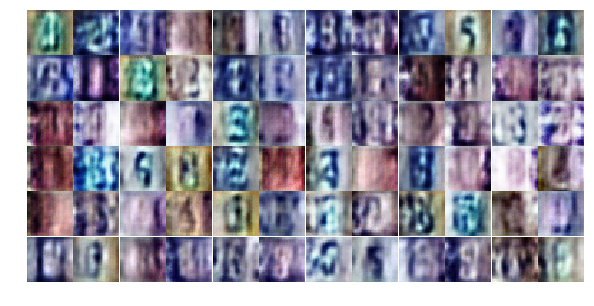

Epoch 3/25... Discriminator Loss: 0.2266... Generator Loss: 2.0646
Epoch 3/25... Discriminator Loss: 0.2403... Generator Loss: 2.4574
Epoch 3/25... Discriminator Loss: 0.0596... Generator Loss: 4.5392
Epoch 3/25... Discriminator Loss: 0.1418... Generator Loss: 5.4156
Epoch 3/25... Discriminator Loss: 0.4776... Generator Loss: 4.4676
Epoch 3/25... Discriminator Loss: 0.4277... Generator Loss: 3.0378
Epoch 3/25... Discriminator Loss: 0.1882... Generator Loss: 5.6052
Epoch 3/25... Discriminator Loss: 0.2380... Generator Loss: 2.6994
Epoch 3/25... Discriminator Loss: 0.3348... Generator Loss: 1.8299
Epoch 3/25... Discriminator Loss: 0.4785... Generator Loss: 1.3804


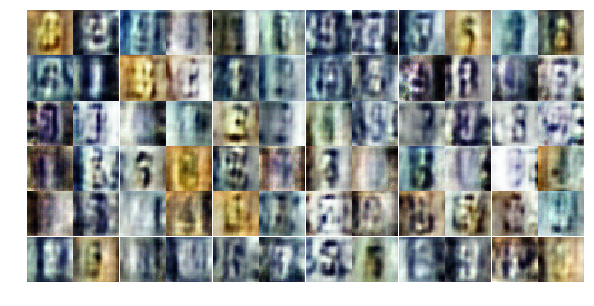

Epoch 3/25... Discriminator Loss: 0.3062... Generator Loss: 3.9473
Epoch 3/25... Discriminator Loss: 0.2649... Generator Loss: 6.4657
Epoch 3/25... Discriminator Loss: 0.3586... Generator Loss: 2.0994
Epoch 3/25... Discriminator Loss: 0.5490... Generator Loss: 7.0646
Epoch 3/25... Discriminator Loss: 0.4573... Generator Loss: 1.1954
Epoch 3/25... Discriminator Loss: 0.2421... Generator Loss: 4.1993
Epoch 3/25... Discriminator Loss: 0.3039... Generator Loss: 1.9638
Epoch 3/25... Discriminator Loss: 0.8839... Generator Loss: 6.9901
Epoch 3/25... Discriminator Loss: 0.8340... Generator Loss: 0.9462
Epoch 3/25... Discriminator Loss: 2.1625... Generator Loss: 0.1852


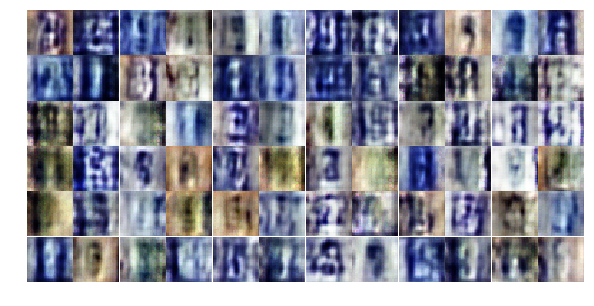

Epoch 3/25... Discriminator Loss: 0.2012... Generator Loss: 3.8484
Epoch 3/25... Discriminator Loss: 0.5178... Generator Loss: 1.2620
Epoch 3/25... Discriminator Loss: 0.2289... Generator Loss: 2.7575
Epoch 3/25... Discriminator Loss: 0.3241... Generator Loss: 3.8531
Epoch 3/25... Discriminator Loss: 0.1136... Generator Loss: 3.7120
Epoch 3/25... Discriminator Loss: 0.2122... Generator Loss: 3.0900
Epoch 3/25... Discriminator Loss: 0.8749... Generator Loss: 6.3667
Epoch 3/25... Discriminator Loss: 0.2249... Generator Loss: 2.6915
Epoch 3/25... Discriminator Loss: 0.7221... Generator Loss: 7.6795
Epoch 3/25... Discriminator Loss: 1.6779... Generator Loss: 0.3329


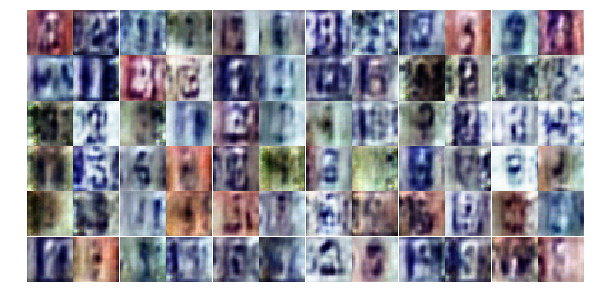

Epoch 3/25... Discriminator Loss: 0.8820... Generator Loss: 1.3874
Epoch 4/25... Discriminator Loss: 0.5368... Generator Loss: 1.4037
Epoch 4/25... Discriminator Loss: 0.3445... Generator Loss: 2.0078
Epoch 4/25... Discriminator Loss: 0.3070... Generator Loss: 2.1799
Epoch 4/25... Discriminator Loss: 0.1986... Generator Loss: 6.0219
Epoch 4/25... Discriminator Loss: 0.9767... Generator Loss: 0.6030
Epoch 4/25... Discriminator Loss: 0.1113... Generator Loss: 4.9319
Epoch 4/25... Discriminator Loss: 0.1993... Generator Loss: 2.8795
Epoch 4/25... Discriminator Loss: 0.5525... Generator Loss: 1.1966
Epoch 4/25... Discriminator Loss: 0.1114... Generator Loss: 4.8011


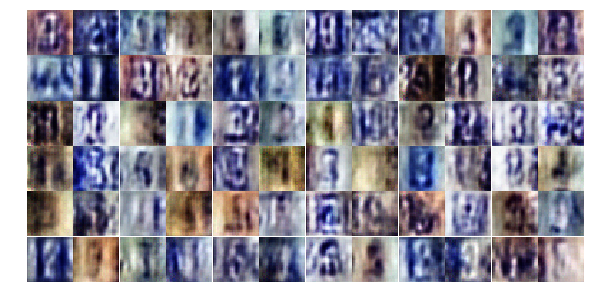

Epoch 4/25... Discriminator Loss: 0.2928... Generator Loss: 3.1265
Epoch 4/25... Discriminator Loss: 0.5068... Generator Loss: 1.1968
Epoch 4/25... Discriminator Loss: 0.0982... Generator Loss: 4.6054
Epoch 4/25... Discriminator Loss: 0.1973... Generator Loss: 2.9885
Epoch 4/25... Discriminator Loss: 0.2040... Generator Loss: 3.7067
Epoch 4/25... Discriminator Loss: 0.3923... Generator Loss: 1.6228
Epoch 4/25... Discriminator Loss: 0.5701... Generator Loss: 1.0688
Epoch 4/25... Discriminator Loss: 1.7464... Generator Loss: 4.2797
Epoch 4/25... Discriminator Loss: 0.2307... Generator Loss: 2.4033
Epoch 4/25... Discriminator Loss: 0.2676... Generator Loss: 1.8490


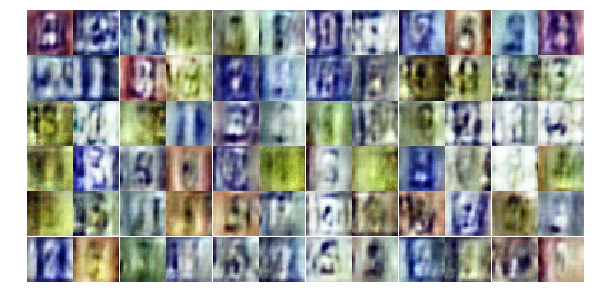

Epoch 4/25... Discriminator Loss: 0.4773... Generator Loss: 1.4881
Epoch 4/25... Discriminator Loss: 0.1339... Generator Loss: 4.5537
Epoch 4/25... Discriminator Loss: 0.0757... Generator Loss: 3.3634
Epoch 4/25... Discriminator Loss: 0.8412... Generator Loss: 4.6861
Epoch 4/25... Discriminator Loss: 0.1918... Generator Loss: 2.6386
Epoch 4/25... Discriminator Loss: 0.1396... Generator Loss: 3.0708
Epoch 4/25... Discriminator Loss: 0.5378... Generator Loss: 1.2044
Epoch 4/25... Discriminator Loss: 0.4672... Generator Loss: 1.4906
Epoch 4/25... Discriminator Loss: 0.1322... Generator Loss: 3.9871
Epoch 4/25... Discriminator Loss: 0.2766... Generator Loss: 2.2888


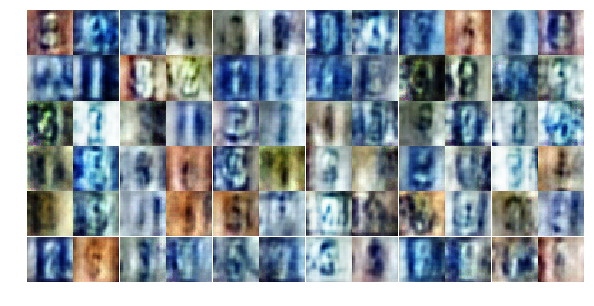

Epoch 4/25... Discriminator Loss: 0.1750... Generator Loss: 6.3204
Epoch 4/25... Discriminator Loss: 0.3703... Generator Loss: 1.6257
Epoch 4/25... Discriminator Loss: 1.6356... Generator Loss: 0.3438
Epoch 4/25... Discriminator Loss: 0.7132... Generator Loss: 1.0597
Epoch 4/25... Discriminator Loss: 0.6767... Generator Loss: 1.0178
Epoch 4/25... Discriminator Loss: 0.6063... Generator Loss: 3.5291
Epoch 4/25... Discriminator Loss: 0.1202... Generator Loss: 5.5337
Epoch 4/25... Discriminator Loss: 0.6426... Generator Loss: 1.0245
Epoch 4/25... Discriminator Loss: 0.2301... Generator Loss: 2.8849
Epoch 4/25... Discriminator Loss: 1.3715... Generator Loss: 0.3736


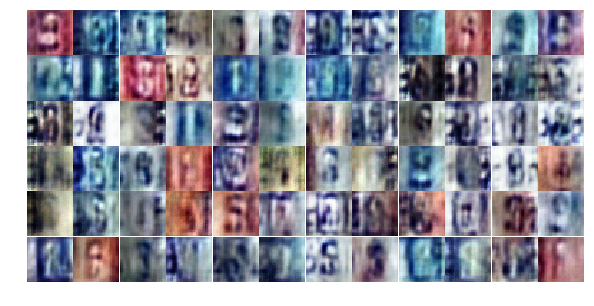

Epoch 4/25... Discriminator Loss: 0.5903... Generator Loss: 1.1341
Epoch 4/25... Discriminator Loss: 0.1657... Generator Loss: 2.7703
Epoch 4/25... Discriminator Loss: 0.2951... Generator Loss: 3.7188
Epoch 4/25... Discriminator Loss: 0.4090... Generator Loss: 1.5102
Epoch 4/25... Discriminator Loss: 0.7562... Generator Loss: 0.9449
Epoch 4/25... Discriminator Loss: 0.3045... Generator Loss: 2.4368
Epoch 4/25... Discriminator Loss: 0.5902... Generator Loss: 1.1593
Epoch 4/25... Discriminator Loss: 0.2743... Generator Loss: 4.5517
Epoch 4/25... Discriminator Loss: 0.1925... Generator Loss: 4.2399
Epoch 4/25... Discriminator Loss: 0.1772... Generator Loss: 4.7535


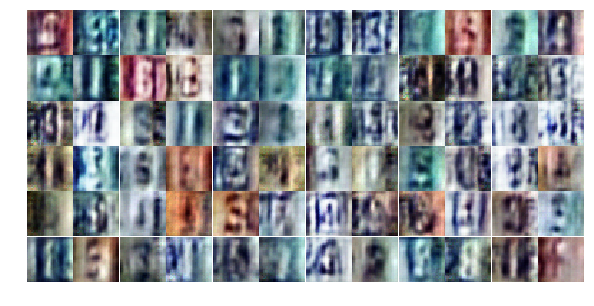

Epoch 4/25... Discriminator Loss: 0.1807... Generator Loss: 3.1425
Epoch 4/25... Discriminator Loss: 0.6872... Generator Loss: 1.0062
Epoch 4/25... Discriminator Loss: 0.0727... Generator Loss: 4.9480
Epoch 4/25... Discriminator Loss: 0.1237... Generator Loss: 4.1864
Epoch 4/25... Discriminator Loss: 0.2765... Generator Loss: 2.1748
Epoch 4/25... Discriminator Loss: 0.1269... Generator Loss: 2.9235
Epoch 4/25... Discriminator Loss: 0.3758... Generator Loss: 1.5427
Epoch 4/25... Discriminator Loss: 0.7351... Generator Loss: 0.9421
Epoch 4/25... Discriminator Loss: 1.1794... Generator Loss: 0.6816
Epoch 5/25... Discriminator Loss: 1.7480... Generator Loss: 2.6680


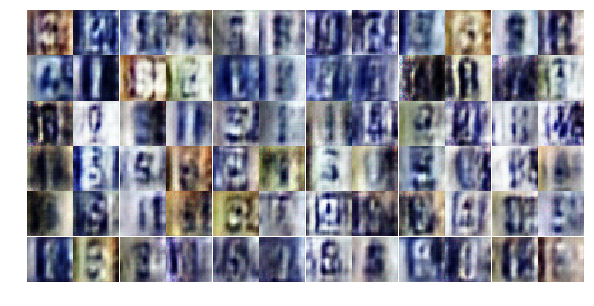

Epoch 5/25... Discriminator Loss: 1.5539... Generator Loss: 0.3837
Epoch 5/25... Discriminator Loss: 0.2985... Generator Loss: 2.4102
Epoch 5/25... Discriminator Loss: 0.4070... Generator Loss: 1.7600
Epoch 5/25... Discriminator Loss: 0.1258... Generator Loss: 2.7635
Epoch 5/25... Discriminator Loss: 0.2253... Generator Loss: 2.7967
Epoch 5/25... Discriminator Loss: 0.3457... Generator Loss: 5.3729
Epoch 5/25... Discriminator Loss: 0.4194... Generator Loss: 2.7478
Epoch 5/25... Discriminator Loss: 0.1708... Generator Loss: 4.5430
Epoch 5/25... Discriminator Loss: 0.8541... Generator Loss: 0.8466
Epoch 5/25... Discriminator Loss: 0.1785... Generator Loss: 3.5271


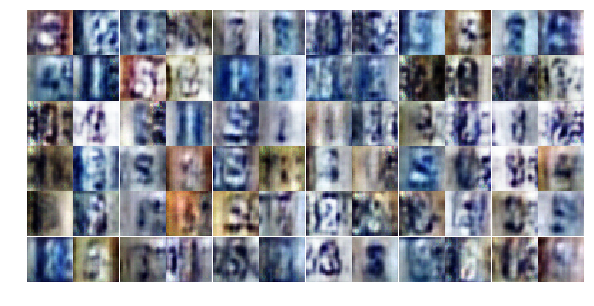

Epoch 5/25... Discriminator Loss: 0.9449... Generator Loss: 0.6755
Epoch 5/25... Discriminator Loss: 0.7414... Generator Loss: 0.8926
Epoch 5/25... Discriminator Loss: 0.3265... Generator Loss: 2.1469
Epoch 5/25... Discriminator Loss: 0.2808... Generator Loss: 2.0999
Epoch 5/25... Discriminator Loss: 1.1869... Generator Loss: 0.5956
Epoch 5/25... Discriminator Loss: 1.5045... Generator Loss: 1.5823
Epoch 5/25... Discriminator Loss: 1.5823... Generator Loss: 0.6579
Epoch 5/25... Discriminator Loss: 0.6349... Generator Loss: 1.8754
Epoch 5/25... Discriminator Loss: 0.4159... Generator Loss: 2.5844
Epoch 5/25... Discriminator Loss: 0.8819... Generator Loss: 1.0623


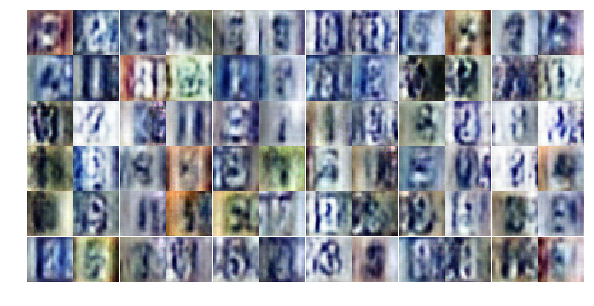

Epoch 5/25... Discriminator Loss: 0.5326... Generator Loss: 1.8702
Epoch 5/25... Discriminator Loss: 0.4892... Generator Loss: 1.8369
Epoch 5/25... Discriminator Loss: 0.6694... Generator Loss: 1.1128
Epoch 5/25... Discriminator Loss: 0.4718... Generator Loss: 1.7641
Epoch 5/25... Discriminator Loss: 0.7201... Generator Loss: 1.0345
Epoch 5/25... Discriminator Loss: 0.7487... Generator Loss: 1.0375
Epoch 5/25... Discriminator Loss: 1.0192... Generator Loss: 0.8609
Epoch 5/25... Discriminator Loss: 0.7845... Generator Loss: 2.0415
Epoch 5/25... Discriminator Loss: 0.6018... Generator Loss: 1.5828
Epoch 5/25... Discriminator Loss: 0.3495... Generator Loss: 2.5803


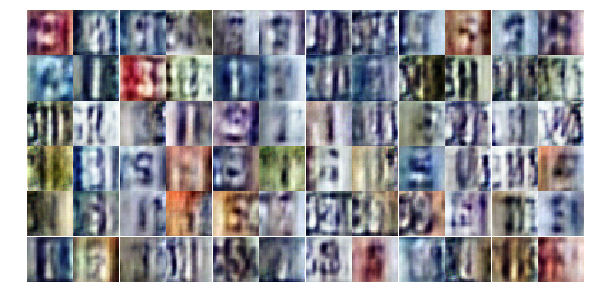

Epoch 5/25... Discriminator Loss: 0.6902... Generator Loss: 1.2755
Epoch 5/25... Discriminator Loss: 0.4921... Generator Loss: 1.5746
Epoch 5/25... Discriminator Loss: 0.6638... Generator Loss: 3.6445
Epoch 5/25... Discriminator Loss: 0.2518... Generator Loss: 2.6559
Epoch 5/25... Discriminator Loss: 0.3501... Generator Loss: 2.7559
Epoch 5/25... Discriminator Loss: 0.5008... Generator Loss: 1.3323
Epoch 5/25... Discriminator Loss: 0.7104... Generator Loss: 5.0441
Epoch 5/25... Discriminator Loss: 0.5289... Generator Loss: 2.0846
Epoch 5/25... Discriminator Loss: 0.2438... Generator Loss: 2.4923
Epoch 5/25... Discriminator Loss: 0.5864... Generator Loss: 1.3190


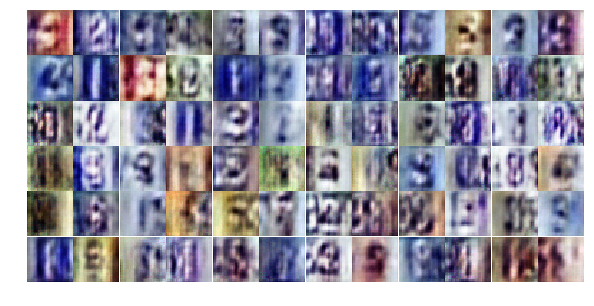

Epoch 5/25... Discriminator Loss: 0.5084... Generator Loss: 2.4206
Epoch 5/25... Discriminator Loss: 0.3958... Generator Loss: 1.9191
Epoch 5/25... Discriminator Loss: 0.5696... Generator Loss: 1.3957
Epoch 5/25... Discriminator Loss: 0.3300... Generator Loss: 1.7254
Epoch 5/25... Discriminator Loss: 0.5733... Generator Loss: 1.3600
Epoch 5/25... Discriminator Loss: 0.8441... Generator Loss: 0.8799
Epoch 5/25... Discriminator Loss: 0.3541... Generator Loss: 2.0213
Epoch 5/25... Discriminator Loss: 0.7448... Generator Loss: 3.7781
Epoch 5/25... Discriminator Loss: 0.2886... Generator Loss: 2.4752
Epoch 5/25... Discriminator Loss: 0.7397... Generator Loss: 0.9457


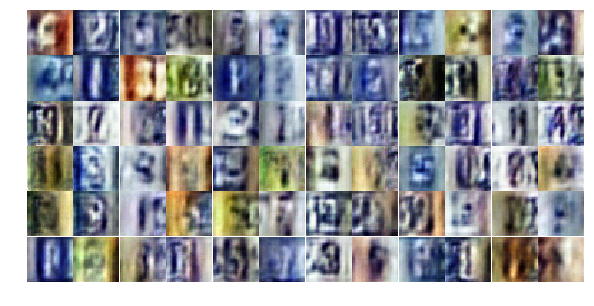

Epoch 5/25... Discriminator Loss: 0.2832... Generator Loss: 3.2101
Epoch 5/25... Discriminator Loss: 0.3495... Generator Loss: 2.2233
Epoch 5/25... Discriminator Loss: 0.1403... Generator Loss: 4.1440
Epoch 5/25... Discriminator Loss: 0.3674... Generator Loss: 1.8596
Epoch 5/25... Discriminator Loss: 0.4014... Generator Loss: 1.6956
Epoch 5/25... Discriminator Loss: 0.2172... Generator Loss: 2.8776
Epoch 6/25... Discriminator Loss: 0.6570... Generator Loss: 1.0276
Epoch 6/25... Discriminator Loss: 0.2583... Generator Loss: 2.0071
Epoch 6/25... Discriminator Loss: 0.1822... Generator Loss: 4.1603
Epoch 6/25... Discriminator Loss: 1.3124... Generator Loss: 0.4386


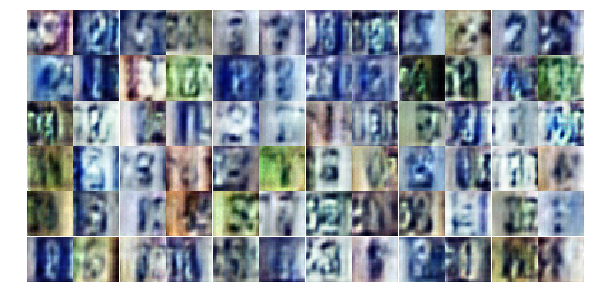

Epoch 6/25... Discriminator Loss: 0.3589... Generator Loss: 1.7692
Epoch 6/25... Discriminator Loss: 0.6505... Generator Loss: 2.9886
Epoch 6/25... Discriminator Loss: 0.5093... Generator Loss: 1.4279
Epoch 6/25... Discriminator Loss: 0.3996... Generator Loss: 1.8859
Epoch 6/25... Discriminator Loss: 0.1835... Generator Loss: 3.2309
Epoch 6/25... Discriminator Loss: 0.2119... Generator Loss: 2.4742
Epoch 6/25... Discriminator Loss: 0.2325... Generator Loss: 3.3426
Epoch 6/25... Discriminator Loss: 0.4382... Generator Loss: 1.5344
Epoch 6/25... Discriminator Loss: 1.0368... Generator Loss: 5.8731
Epoch 6/25... Discriminator Loss: 0.1612... Generator Loss: 3.9414


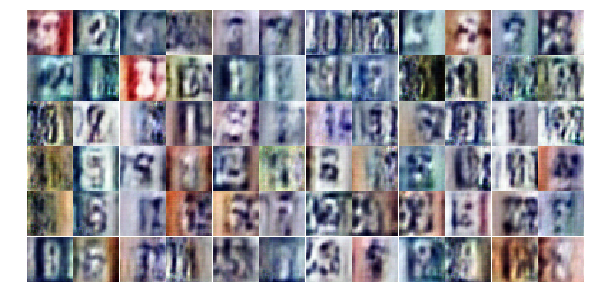

Epoch 6/25... Discriminator Loss: 0.2827... Generator Loss: 1.8007
Epoch 6/25... Discriminator Loss: 0.1080... Generator Loss: 4.7747
Epoch 6/25... Discriminator Loss: 0.3497... Generator Loss: 1.7304
Epoch 6/25... Discriminator Loss: 0.1623... Generator Loss: 2.7653
Epoch 6/25... Discriminator Loss: 0.1560... Generator Loss: 4.0938
Epoch 6/25... Discriminator Loss: 0.2891... Generator Loss: 3.7552
Epoch 6/25... Discriminator Loss: 0.1840... Generator Loss: 2.3000
Epoch 6/25... Discriminator Loss: 1.3693... Generator Loss: 0.4606
Epoch 6/25... Discriminator Loss: 0.3228... Generator Loss: 3.3785
Epoch 6/25... Discriminator Loss: 0.8475... Generator Loss: 0.7891


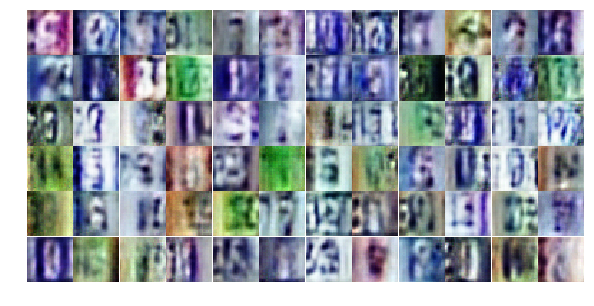

Epoch 6/25... Discriminator Loss: 0.1635... Generator Loss: 3.2399
Epoch 6/25... Discriminator Loss: 0.3720... Generator Loss: 1.9225
Epoch 6/25... Discriminator Loss: 0.1735... Generator Loss: 2.5683
Epoch 6/25... Discriminator Loss: 1.8047... Generator Loss: 1.1003
Epoch 6/25... Discriminator Loss: 0.4825... Generator Loss: 2.4585
Epoch 6/25... Discriminator Loss: 0.3314... Generator Loss: 2.2832
Epoch 6/25... Discriminator Loss: 0.4799... Generator Loss: 1.6148
Epoch 6/25... Discriminator Loss: 0.4630... Generator Loss: 1.2791
Epoch 6/25... Discriminator Loss: 1.0718... Generator Loss: 0.6103
Epoch 6/25... Discriminator Loss: 0.1328... Generator Loss: 3.4765


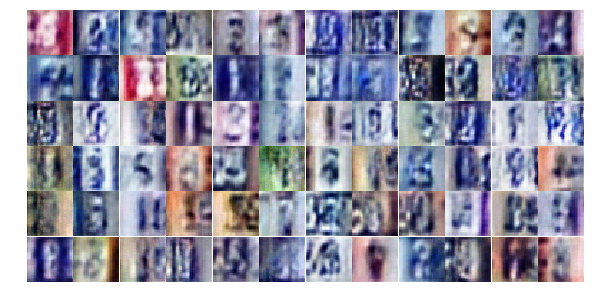

Epoch 6/25... Discriminator Loss: 0.7416... Generator Loss: 0.9587
Epoch 6/25... Discriminator Loss: 0.3348... Generator Loss: 3.5071
Epoch 6/25... Discriminator Loss: 0.2636... Generator Loss: 2.3054
Epoch 6/25... Discriminator Loss: 0.2827... Generator Loss: 2.5026
Epoch 6/25... Discriminator Loss: 0.2451... Generator Loss: 3.8180
Epoch 6/25... Discriminator Loss: 0.2948... Generator Loss: 2.9109
Epoch 6/25... Discriminator Loss: 0.1713... Generator Loss: 3.3045
Epoch 6/25... Discriminator Loss: 0.3674... Generator Loss: 1.7049
Epoch 6/25... Discriminator Loss: 0.3173... Generator Loss: 1.9166
Epoch 6/25... Discriminator Loss: 0.1541... Generator Loss: 2.9437


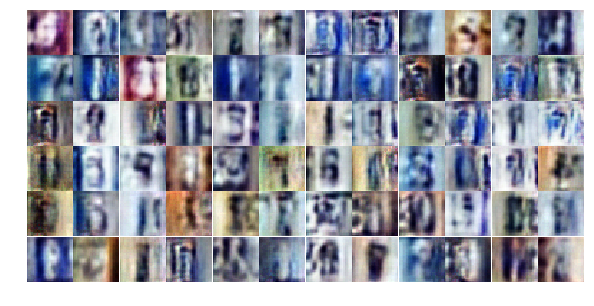

Epoch 6/25... Discriminator Loss: 0.9833... Generator Loss: 0.8726
Epoch 6/25... Discriminator Loss: 0.4284... Generator Loss: 2.7959
Epoch 6/25... Discriminator Loss: 0.2137... Generator Loss: 3.2955
Epoch 6/25... Discriminator Loss: 0.9651... Generator Loss: 4.2296
Epoch 6/25... Discriminator Loss: 0.2684... Generator Loss: 2.3533
Epoch 6/25... Discriminator Loss: 0.7650... Generator Loss: 0.9133
Epoch 6/25... Discriminator Loss: 0.1649... Generator Loss: 2.7807
Epoch 6/25... Discriminator Loss: 0.4033... Generator Loss: 1.4862
Epoch 6/25... Discriminator Loss: 0.6635... Generator Loss: 1.0146
Epoch 6/25... Discriminator Loss: 0.6066... Generator Loss: 1.1892


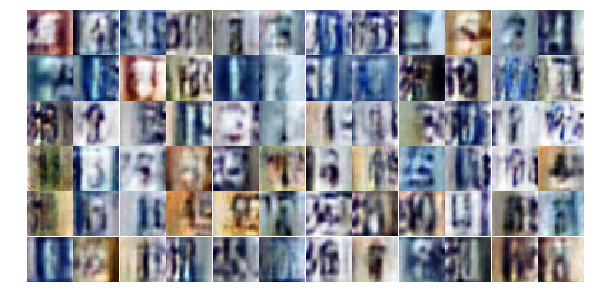

Epoch 6/25... Discriminator Loss: 0.5701... Generator Loss: 1.2576
Epoch 6/25... Discriminator Loss: 0.1536... Generator Loss: 7.0644
Epoch 6/25... Discriminator Loss: 0.2741... Generator Loss: 1.9474
Epoch 7/25... Discriminator Loss: 0.2179... Generator Loss: 2.2543
Epoch 7/25... Discriminator Loss: 0.4180... Generator Loss: 1.6141
Epoch 7/25... Discriminator Loss: 0.3959... Generator Loss: 1.9503
Epoch 7/25... Discriminator Loss: 0.1841... Generator Loss: 2.5706
Epoch 7/25... Discriminator Loss: 0.2239... Generator Loss: 2.3308
Epoch 7/25... Discriminator Loss: 0.9063... Generator Loss: 3.5787
Epoch 7/25... Discriminator Loss: 0.4492... Generator Loss: 1.7814


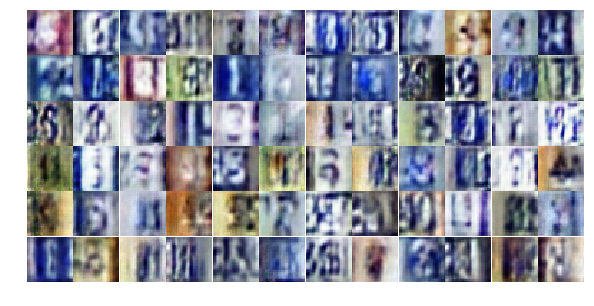

Epoch 7/25... Discriminator Loss: 0.2876... Generator Loss: 2.1013
Epoch 7/25... Discriminator Loss: 0.1575... Generator Loss: 3.0479
Epoch 7/25... Discriminator Loss: 0.4745... Generator Loss: 1.3045
Epoch 7/25... Discriminator Loss: 0.2993... Generator Loss: 1.9373
Epoch 7/25... Discriminator Loss: 0.2396... Generator Loss: 2.6422
Epoch 7/25... Discriminator Loss: 0.2540... Generator Loss: 2.4195
Epoch 7/25... Discriminator Loss: 0.2209... Generator Loss: 3.4694
Epoch 7/25... Discriminator Loss: 0.8826... Generator Loss: 4.1957
Epoch 7/25... Discriminator Loss: 0.7530... Generator Loss: 4.3786
Epoch 7/25... Discriminator Loss: 0.1647... Generator Loss: 2.6142


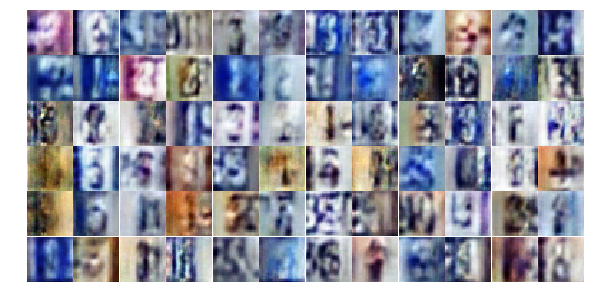

Epoch 7/25... Discriminator Loss: 0.2803... Generator Loss: 2.5697
Epoch 7/25... Discriminator Loss: 0.4053... Generator Loss: 1.6929
Epoch 7/25... Discriminator Loss: 0.2463... Generator Loss: 2.3752
Epoch 7/25... Discriminator Loss: 0.4432... Generator Loss: 3.0954
Epoch 7/25... Discriminator Loss: 0.4587... Generator Loss: 1.4348
Epoch 7/25... Discriminator Loss: 0.3091... Generator Loss: 2.4152
Epoch 7/25... Discriminator Loss: 0.3170... Generator Loss: 2.1157
Epoch 7/25... Discriminator Loss: 0.2427... Generator Loss: 2.2827
Epoch 7/25... Discriminator Loss: 0.4990... Generator Loss: 5.9167
Epoch 7/25... Discriminator Loss: 0.3614... Generator Loss: 1.9993


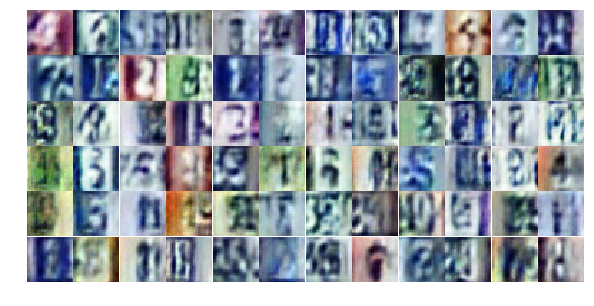

Epoch 7/25... Discriminator Loss: 1.1924... Generator Loss: 0.5844
Epoch 7/25... Discriminator Loss: 0.2552... Generator Loss: 2.3197
Epoch 7/25... Discriminator Loss: 0.1696... Generator Loss: 2.9231
Epoch 7/25... Discriminator Loss: 0.1875... Generator Loss: 2.9304
Epoch 7/25... Discriminator Loss: 0.3266... Generator Loss: 1.9102
Epoch 7/25... Discriminator Loss: 0.2853... Generator Loss: 3.4142
Epoch 7/25... Discriminator Loss: 0.5642... Generator Loss: 1.1535
Epoch 7/25... Discriminator Loss: 0.3538... Generator Loss: 1.7742
Epoch 7/25... Discriminator Loss: 0.8467... Generator Loss: 0.7627
Epoch 7/25... Discriminator Loss: 0.2617... Generator Loss: 2.1607


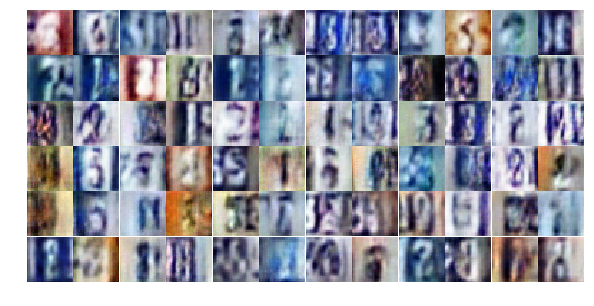

Epoch 7/25... Discriminator Loss: 0.4972... Generator Loss: 3.0512
Epoch 7/25... Discriminator Loss: 0.1343... Generator Loss: 3.1108
Epoch 7/25... Discriminator Loss: 0.1953... Generator Loss: 3.5425
Epoch 7/25... Discriminator Loss: 0.3423... Generator Loss: 2.3052
Epoch 7/25... Discriminator Loss: 1.0261... Generator Loss: 5.1875
Epoch 7/25... Discriminator Loss: 1.1721... Generator Loss: 6.0968
Epoch 7/25... Discriminator Loss: 1.1184... Generator Loss: 0.6075
Epoch 7/25... Discriminator Loss: 0.5290... Generator Loss: 1.6221
Epoch 7/25... Discriminator Loss: 0.2388... Generator Loss: 4.7238
Epoch 7/25... Discriminator Loss: 0.5990... Generator Loss: 1.2043


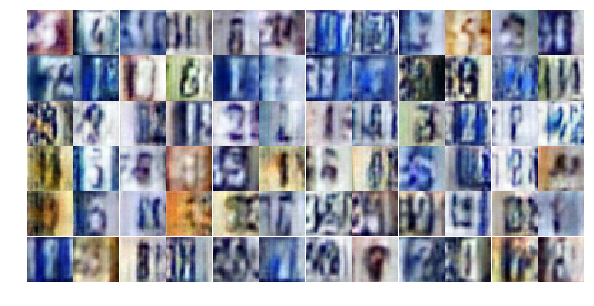

Epoch 7/25... Discriminator Loss: 0.3028... Generator Loss: 1.8433
Epoch 7/25... Discriminator Loss: 0.2904... Generator Loss: 2.0313
Epoch 7/25... Discriminator Loss: 0.5895... Generator Loss: 1.1364
Epoch 7/25... Discriminator Loss: 0.1827... Generator Loss: 2.8023
Epoch 7/25... Discriminator Loss: 0.6298... Generator Loss: 1.0335
Epoch 7/25... Discriminator Loss: 0.2888... Generator Loss: 1.9861
Epoch 7/25... Discriminator Loss: 0.4112... Generator Loss: 1.4090
Epoch 7/25... Discriminator Loss: 0.2606... Generator Loss: 2.6740
Epoch 7/25... Discriminator Loss: 0.5450... Generator Loss: 1.1577
Epoch 7/25... Discriminator Loss: 2.0193... Generator Loss: 0.3020


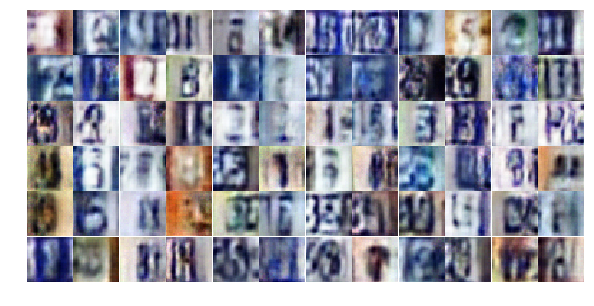

Epoch 7/25... Discriminator Loss: 2.5350... Generator Loss: 1.5417
Epoch 8/25... Discriminator Loss: 1.1144... Generator Loss: 1.6990
Epoch 8/25... Discriminator Loss: 1.2879... Generator Loss: 0.5609
Epoch 8/25... Discriminator Loss: 0.8833... Generator Loss: 2.9781
Epoch 8/25... Discriminator Loss: 0.6294... Generator Loss: 1.1801
Epoch 8/25... Discriminator Loss: 0.4707... Generator Loss: 2.2864
Epoch 8/25... Discriminator Loss: 0.9883... Generator Loss: 0.8453
Epoch 8/25... Discriminator Loss: 0.4569... Generator Loss: 2.3311
Epoch 8/25... Discriminator Loss: 0.6310... Generator Loss: 1.2879
Epoch 8/25... Discriminator Loss: 0.4389... Generator Loss: 2.7923


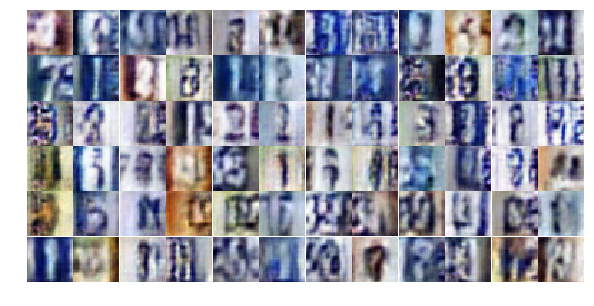

Epoch 8/25... Discriminator Loss: 0.3177... Generator Loss: 2.0407
Epoch 8/25... Discriminator Loss: 0.2378... Generator Loss: 2.0269
Epoch 8/25... Discriminator Loss: 0.5350... Generator Loss: 3.2887
Epoch 8/25... Discriminator Loss: 0.1547... Generator Loss: 3.1659
Epoch 8/25... Discriminator Loss: 0.4066... Generator Loss: 1.7421
Epoch 8/25... Discriminator Loss: 1.7030... Generator Loss: 4.6075
Epoch 8/25... Discriminator Loss: 0.1833... Generator Loss: 2.8986
Epoch 8/25... Discriminator Loss: 0.6799... Generator Loss: 1.2786
Epoch 8/25... Discriminator Loss: 0.5160... Generator Loss: 1.3813
Epoch 8/25... Discriminator Loss: 0.3535... Generator Loss: 1.9864


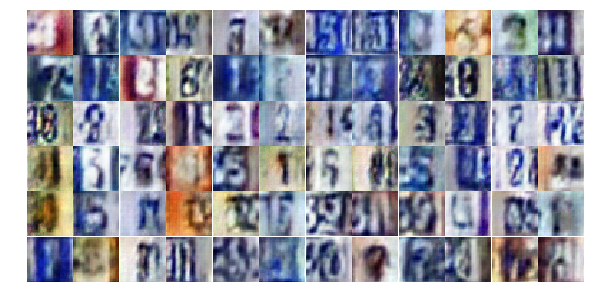

Epoch 8/25... Discriminator Loss: 0.2799... Generator Loss: 2.7800
Epoch 8/25... Discriminator Loss: 0.5848... Generator Loss: 1.1214
Epoch 8/25... Discriminator Loss: 0.3141... Generator Loss: 2.3121
Epoch 8/25... Discriminator Loss: 0.2908... Generator Loss: 2.3495
Epoch 8/25... Discriminator Loss: 0.2171... Generator Loss: 2.5252
Epoch 8/25... Discriminator Loss: 0.5151... Generator Loss: 1.3434
Epoch 8/25... Discriminator Loss: 0.6729... Generator Loss: 3.2645
Epoch 8/25... Discriminator Loss: 0.5566... Generator Loss: 1.1500
Epoch 8/25... Discriminator Loss: 0.3733... Generator Loss: 2.1654
Epoch 8/25... Discriminator Loss: 1.4179... Generator Loss: 3.5446


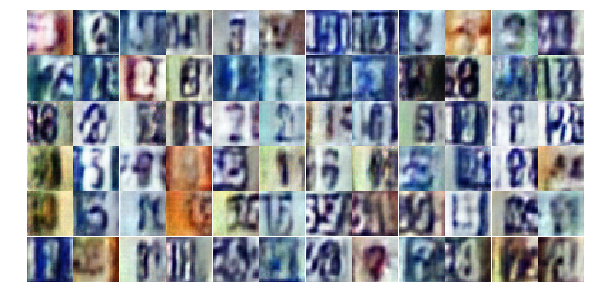

Epoch 8/25... Discriminator Loss: 0.4980... Generator Loss: 1.4158
Epoch 8/25... Discriminator Loss: 0.3530... Generator Loss: 1.7250
Epoch 8/25... Discriminator Loss: 0.3637... Generator Loss: 2.1295
Epoch 8/25... Discriminator Loss: 0.5255... Generator Loss: 1.3093
Epoch 8/25... Discriminator Loss: 0.2884... Generator Loss: 2.5496
Epoch 8/25... Discriminator Loss: 0.1356... Generator Loss: 3.1709
Epoch 8/25... Discriminator Loss: 0.5494... Generator Loss: 1.5253
Epoch 8/25... Discriminator Loss: 0.3876... Generator Loss: 2.6041
Epoch 8/25... Discriminator Loss: 0.6980... Generator Loss: 1.0425
Epoch 8/25... Discriminator Loss: 0.3726... Generator Loss: 1.5539


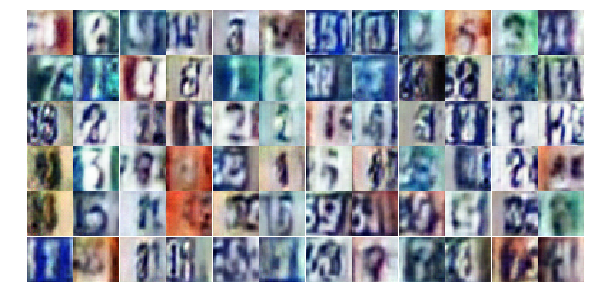

Epoch 8/25... Discriminator Loss: 0.3222... Generator Loss: 1.7654
Epoch 8/25... Discriminator Loss: 0.4274... Generator Loss: 1.5492
Epoch 8/25... Discriminator Loss: 0.5759... Generator Loss: 1.1402
Epoch 8/25... Discriminator Loss: 0.4929... Generator Loss: 1.3166
Epoch 8/25... Discriminator Loss: 1.1962... Generator Loss: 3.9838
Epoch 8/25... Discriminator Loss: 0.6243... Generator Loss: 1.0777
Epoch 8/25... Discriminator Loss: 0.3825... Generator Loss: 2.7008
Epoch 8/25... Discriminator Loss: 0.4097... Generator Loss: 1.3777
Epoch 8/25... Discriminator Loss: 0.3044... Generator Loss: 1.8191
Epoch 8/25... Discriminator Loss: 0.5484... Generator Loss: 1.1140


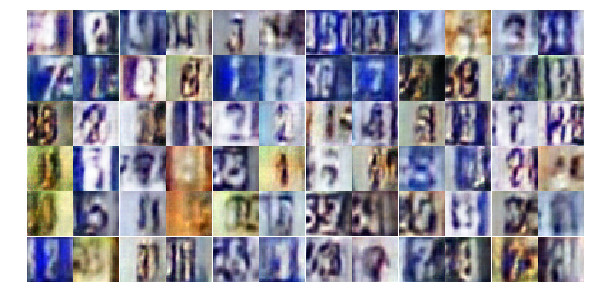

Epoch 8/25... Discriminator Loss: 0.5339... Generator Loss: 1.1550
Epoch 8/25... Discriminator Loss: 0.2605... Generator Loss: 4.6344
Epoch 8/25... Discriminator Loss: 0.2242... Generator Loss: 2.3478
Epoch 8/25... Discriminator Loss: 0.2409... Generator Loss: 3.3202
Epoch 8/25... Discriminator Loss: 1.8583... Generator Loss: 0.3513
Epoch 8/25... Discriminator Loss: 0.6490... Generator Loss: 1.0752
Epoch 8/25... Discriminator Loss: 0.4899... Generator Loss: 1.3479
Epoch 8/25... Discriminator Loss: 0.2981... Generator Loss: 2.5944
Epoch 9/25... Discriminator Loss: 0.2391... Generator Loss: 2.7466
Epoch 9/25... Discriminator Loss: 0.4823... Generator Loss: 1.3896


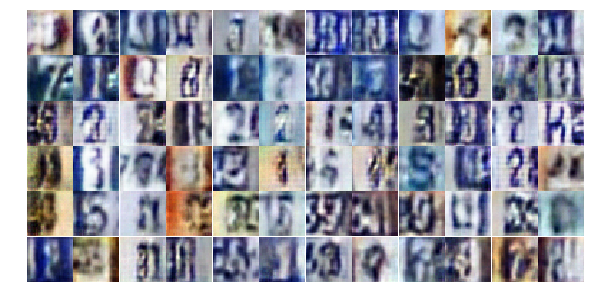

Epoch 9/25... Discriminator Loss: 0.7453... Generator Loss: 1.1546
Epoch 9/25... Discriminator Loss: 0.4754... Generator Loss: 1.3254
Epoch 9/25... Discriminator Loss: 0.4684... Generator Loss: 1.3536
Epoch 9/25... Discriminator Loss: 0.4004... Generator Loss: 1.8708
Epoch 9/25... Discriminator Loss: 0.3189... Generator Loss: 2.6891
Epoch 9/25... Discriminator Loss: 1.2977... Generator Loss: 4.6050
Epoch 9/25... Discriminator Loss: 0.6336... Generator Loss: 1.0258
Epoch 9/25... Discriminator Loss: 0.5983... Generator Loss: 1.1265
Epoch 9/25... Discriminator Loss: 0.2835... Generator Loss: 3.2958
Epoch 9/25... Discriminator Loss: 0.2617... Generator Loss: 2.1173


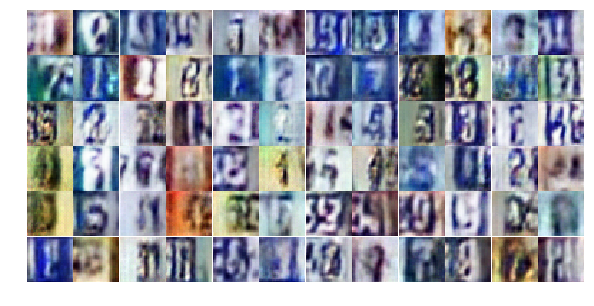

Epoch 9/25... Discriminator Loss: 0.7015... Generator Loss: 1.0824
Epoch 9/25... Discriminator Loss: 0.3930... Generator Loss: 1.7706
Epoch 9/25... Discriminator Loss: 2.7715... Generator Loss: 5.6039
Epoch 9/25... Discriminator Loss: 1.0811... Generator Loss: 0.6381
Epoch 9/25... Discriminator Loss: 0.4145... Generator Loss: 1.6475
Epoch 9/25... Discriminator Loss: 0.4553... Generator Loss: 1.8049
Epoch 9/25... Discriminator Loss: 0.8221... Generator Loss: 0.8682
Epoch 9/25... Discriminator Loss: 0.4037... Generator Loss: 1.4756
Epoch 9/25... Discriminator Loss: 0.5581... Generator Loss: 1.1512
Epoch 9/25... Discriminator Loss: 0.4819... Generator Loss: 1.5071


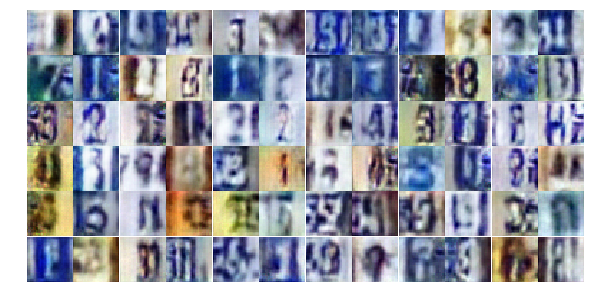

Epoch 9/25... Discriminator Loss: 0.3746... Generator Loss: 1.7912
Epoch 9/25... Discriminator Loss: 0.3939... Generator Loss: 3.5830
Epoch 9/25... Discriminator Loss: 0.5140... Generator Loss: 1.2186
Epoch 9/25... Discriminator Loss: 0.5937... Generator Loss: 1.1609
Epoch 9/25... Discriminator Loss: 0.5133... Generator Loss: 1.4656
Epoch 9/25... Discriminator Loss: 0.3492... Generator Loss: 1.9392
Epoch 9/25... Discriminator Loss: 0.4029... Generator Loss: 1.5554
Epoch 9/25... Discriminator Loss: 3.0177... Generator Loss: 5.2410
Epoch 9/25... Discriminator Loss: 0.3013... Generator Loss: 3.4070
Epoch 9/25... Discriminator Loss: 0.3386... Generator Loss: 2.2516


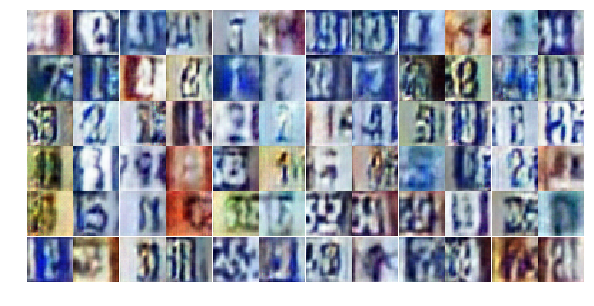

Epoch 9/25... Discriminator Loss: 0.3156... Generator Loss: 1.8178
Epoch 9/25... Discriminator Loss: 0.6761... Generator Loss: 1.0054
Epoch 9/25... Discriminator Loss: 0.5943... Generator Loss: 2.4242
Epoch 9/25... Discriminator Loss: 0.3728... Generator Loss: 1.6429
Epoch 9/25... Discriminator Loss: 0.7851... Generator Loss: 3.2469
Epoch 9/25... Discriminator Loss: 0.4776... Generator Loss: 1.8208
Epoch 9/25... Discriminator Loss: 0.5926... Generator Loss: 1.0855
Epoch 9/25... Discriminator Loss: 0.7938... Generator Loss: 0.7580
Epoch 9/25... Discriminator Loss: 0.5175... Generator Loss: 1.3055
Epoch 9/25... Discriminator Loss: 0.4532... Generator Loss: 1.5473


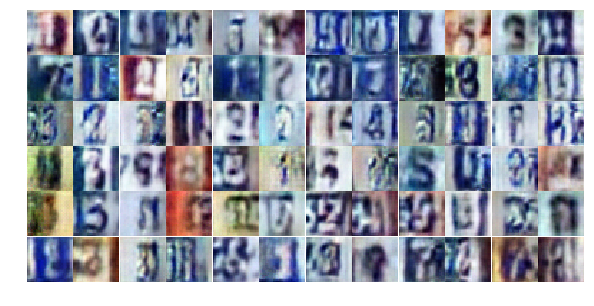

Epoch 9/25... Discriminator Loss: 0.3914... Generator Loss: 1.6501
Epoch 9/25... Discriminator Loss: 0.5672... Generator Loss: 1.0852
Epoch 9/25... Discriminator Loss: 0.4723... Generator Loss: 1.8892
Epoch 9/25... Discriminator Loss: 0.5770... Generator Loss: 1.4481
Epoch 9/25... Discriminator Loss: 0.4360... Generator Loss: 1.4164
Epoch 9/25... Discriminator Loss: 0.7147... Generator Loss: 0.9231
Epoch 9/25... Discriminator Loss: 0.1561... Generator Loss: 2.7727
Epoch 9/25... Discriminator Loss: 0.5271... Generator Loss: 3.3372
Epoch 9/25... Discriminator Loss: 0.5544... Generator Loss: 2.6822
Epoch 9/25... Discriminator Loss: 0.7652... Generator Loss: 4.4842


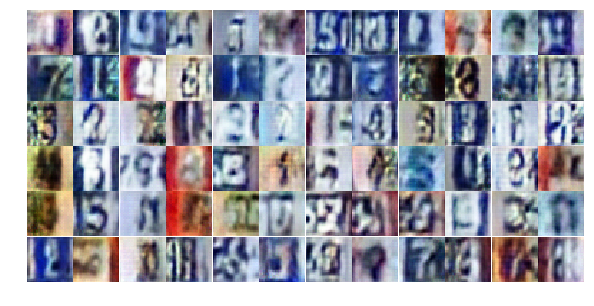

Epoch 9/25... Discriminator Loss: 1.0595... Generator Loss: 2.9678
Epoch 9/25... Discriminator Loss: 0.4120... Generator Loss: 3.0652
Epoch 9/25... Discriminator Loss: 0.3336... Generator Loss: 1.9284
Epoch 9/25... Discriminator Loss: 0.6404... Generator Loss: 1.9878
Epoch 9/25... Discriminator Loss: 0.2693... Generator Loss: 2.2690
Epoch 10/25... Discriminator Loss: 0.2529... Generator Loss: 2.2632
Epoch 10/25... Discriminator Loss: 0.4884... Generator Loss: 1.4492
Epoch 10/25... Discriminator Loss: 0.6663... Generator Loss: 0.9619
Epoch 10/25... Discriminator Loss: 4.5621... Generator Loss: 6.5524
Epoch 10/25... Discriminator Loss: 0.7848... Generator Loss: 1.0734


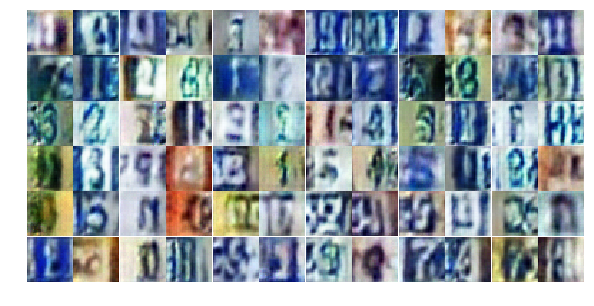

Epoch 10/25... Discriminator Loss: 1.8739... Generator Loss: 0.3185
Epoch 10/25... Discriminator Loss: 0.5973... Generator Loss: 1.0851
Epoch 10/25... Discriminator Loss: 0.6123... Generator Loss: 1.1779
Epoch 10/25... Discriminator Loss: 0.4054... Generator Loss: 2.0312
Epoch 10/25... Discriminator Loss: 0.4224... Generator Loss: 1.5905
Epoch 10/25... Discriminator Loss: 0.4896... Generator Loss: 1.4304
Epoch 10/25... Discriminator Loss: 0.4199... Generator Loss: 1.5287
Epoch 10/25... Discriminator Loss: 0.3580... Generator Loss: 1.6631
Epoch 10/25... Discriminator Loss: 0.9829... Generator Loss: 0.6794
Epoch 10/25... Discriminator Loss: 0.3506... Generator Loss: 2.1764


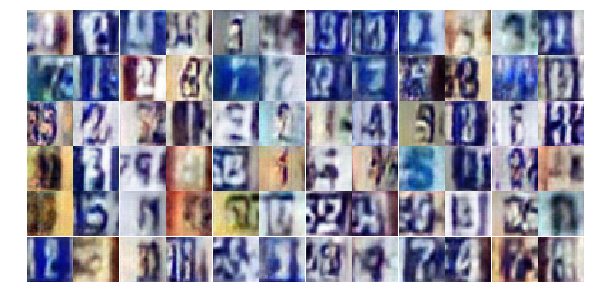

Epoch 10/25... Discriminator Loss: 0.4091... Generator Loss: 1.6569
Epoch 10/25... Discriminator Loss: 0.7272... Generator Loss: 0.9356
Epoch 10/25... Discriminator Loss: 0.3816... Generator Loss: 1.7710
Epoch 10/25... Discriminator Loss: 1.7615... Generator Loss: 0.3310
Epoch 10/25... Discriminator Loss: 0.4246... Generator Loss: 2.2196
Epoch 10/25... Discriminator Loss: 0.5397... Generator Loss: 1.2080
Epoch 10/25... Discriminator Loss: 0.4491... Generator Loss: 1.4116
Epoch 10/25... Discriminator Loss: 0.3263... Generator Loss: 2.3667
Epoch 10/25... Discriminator Loss: 0.4347... Generator Loss: 1.4265
Epoch 10/25... Discriminator Loss: 0.5108... Generator Loss: 3.0518


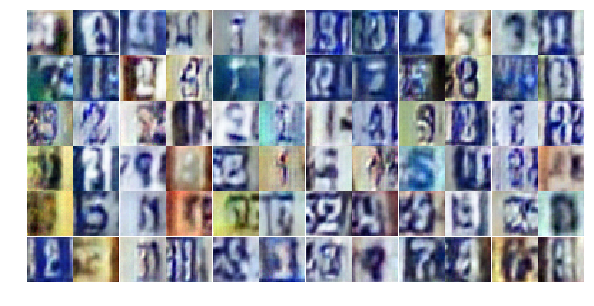

Epoch 10/25... Discriminator Loss: 0.3687... Generator Loss: 1.5682
Epoch 10/25... Discriminator Loss: 0.5376... Generator Loss: 1.2639
Epoch 10/25... Discriminator Loss: 0.1273... Generator Loss: 3.1554
Epoch 10/25... Discriminator Loss: 0.2343... Generator Loss: 2.4300
Epoch 10/25... Discriminator Loss: 0.6434... Generator Loss: 0.9685
Epoch 10/25... Discriminator Loss: 0.6073... Generator Loss: 1.0800
Epoch 10/25... Discriminator Loss: 0.1402... Generator Loss: 3.0220
Epoch 10/25... Discriminator Loss: 0.3951... Generator Loss: 3.1041
Epoch 10/25... Discriminator Loss: 0.8724... Generator Loss: 3.4750
Epoch 10/25... Discriminator Loss: 0.8093... Generator Loss: 0.8580


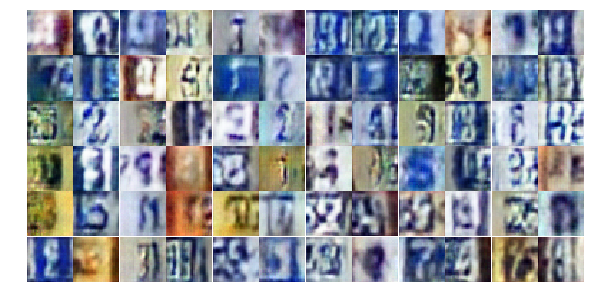

Epoch 10/25... Discriminator Loss: 0.4589... Generator Loss: 1.3751
Epoch 10/25... Discriminator Loss: 0.7706... Generator Loss: 1.0127
Epoch 10/25... Discriminator Loss: 0.5275... Generator Loss: 1.4032
Epoch 10/25... Discriminator Loss: 0.5492... Generator Loss: 1.2905
Epoch 10/25... Discriminator Loss: 0.4838... Generator Loss: 1.3401
Epoch 10/25... Discriminator Loss: 1.2111... Generator Loss: 0.5733
Epoch 10/25... Discriminator Loss: 0.5913... Generator Loss: 1.2377
Epoch 10/25... Discriminator Loss: 0.7108... Generator Loss: 0.9924
Epoch 10/25... Discriminator Loss: 0.3656... Generator Loss: 1.5940
Epoch 10/25... Discriminator Loss: 0.5865... Generator Loss: 3.0236


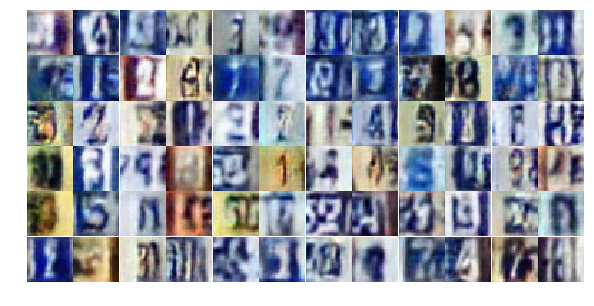

Epoch 10/25... Discriminator Loss: 0.3036... Generator Loss: 2.0528
Epoch 10/25... Discriminator Loss: 2.3774... Generator Loss: 5.4887
Epoch 10/25... Discriminator Loss: 0.8740... Generator Loss: 0.7767
Epoch 10/25... Discriminator Loss: 0.4299... Generator Loss: 1.5210
Epoch 10/25... Discriminator Loss: 0.8594... Generator Loss: 3.3253
Epoch 10/25... Discriminator Loss: 0.5530... Generator Loss: 1.1254
Epoch 10/25... Discriminator Loss: 0.3594... Generator Loss: 1.9789
Epoch 10/25... Discriminator Loss: 0.3716... Generator Loss: 1.7677
Epoch 10/25... Discriminator Loss: 0.2698... Generator Loss: 3.1119
Epoch 10/25... Discriminator Loss: 0.5731... Generator Loss: 1.2917


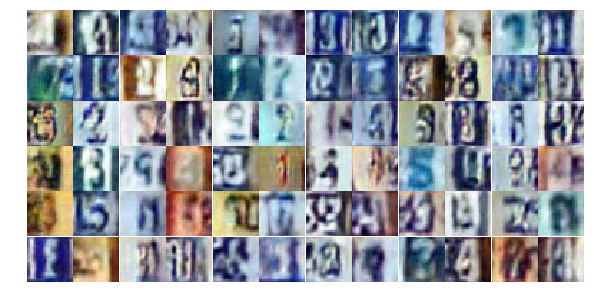

Epoch 10/25... Discriminator Loss: 0.4870... Generator Loss: 2.1823
Epoch 10/25... Discriminator Loss: 0.2778... Generator Loss: 2.3925
Epoch 10/25... Discriminator Loss: 0.1071... Generator Loss: 3.2350
Epoch 11/25... Discriminator Loss: 0.3910... Generator Loss: 1.6383
Epoch 11/25... Discriminator Loss: 0.3492... Generator Loss: 2.0096
Epoch 11/25... Discriminator Loss: 0.8958... Generator Loss: 1.3316
Epoch 11/25... Discriminator Loss: 0.6486... Generator Loss: 0.9790
Epoch 11/25... Discriminator Loss: 0.1659... Generator Loss: 4.1160
Epoch 11/25... Discriminator Loss: 1.7953... Generator Loss: 0.2781
Epoch 11/25... Discriminator Loss: 0.5622... Generator Loss: 1.2413


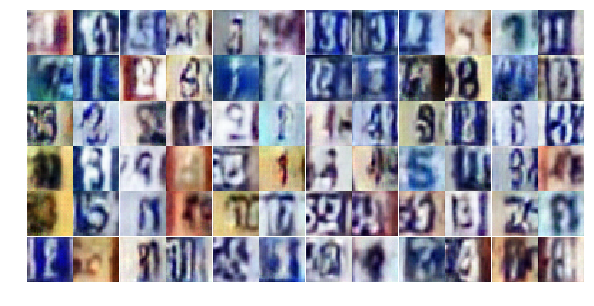

Epoch 11/25... Discriminator Loss: 0.2829... Generator Loss: 3.0008
Epoch 11/25... Discriminator Loss: 0.4441... Generator Loss: 1.9998
Epoch 11/25... Discriminator Loss: 0.2915... Generator Loss: 2.0526
Epoch 11/25... Discriminator Loss: 0.2906... Generator Loss: 2.0457
Epoch 11/25... Discriminator Loss: 0.4293... Generator Loss: 1.4648
Epoch 11/25... Discriminator Loss: 0.1318... Generator Loss: 3.2164
Epoch 11/25... Discriminator Loss: 0.5223... Generator Loss: 1.2853
Epoch 11/25... Discriminator Loss: 0.2517... Generator Loss: 4.7494
Epoch 11/25... Discriminator Loss: 1.1695... Generator Loss: 0.6591
Epoch 11/25... Discriminator Loss: 0.9534... Generator Loss: 0.7985


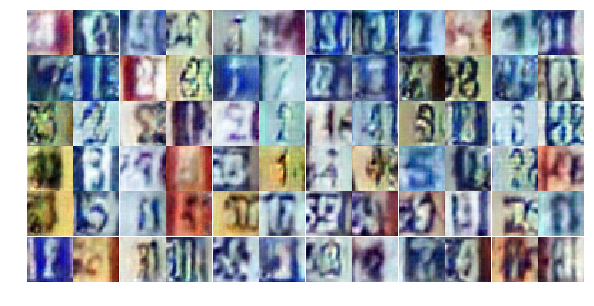

Epoch 11/25... Discriminator Loss: 0.5336... Generator Loss: 1.2258
Epoch 11/25... Discriminator Loss: 0.1457... Generator Loss: 2.7397
Epoch 11/25... Discriminator Loss: 0.5772... Generator Loss: 1.1179
Epoch 11/25... Discriminator Loss: 0.4262... Generator Loss: 1.4666
Epoch 11/25... Discriminator Loss: 0.1630... Generator Loss: 2.5343
Epoch 11/25... Discriminator Loss: 0.2430... Generator Loss: 2.4277
Epoch 11/25... Discriminator Loss: 0.2622... Generator Loss: 2.0855
Epoch 11/25... Discriminator Loss: 0.7529... Generator Loss: 0.9271
Epoch 11/25... Discriminator Loss: 0.2182... Generator Loss: 2.4544
Epoch 11/25... Discriminator Loss: 0.3415... Generator Loss: 1.7535


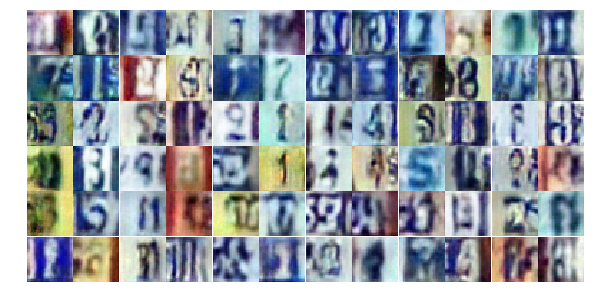

Epoch 11/25... Discriminator Loss: 0.3958... Generator Loss: 1.5374
Epoch 11/25... Discriminator Loss: 0.3249... Generator Loss: 2.7630
Epoch 11/25... Discriminator Loss: 1.2752... Generator Loss: 0.6486
Epoch 11/25... Discriminator Loss: 0.4304... Generator Loss: 4.5389
Epoch 11/25... Discriminator Loss: 0.4670... Generator Loss: 1.3476
Epoch 11/25... Discriminator Loss: 0.6850... Generator Loss: 0.9699
Epoch 11/25... Discriminator Loss: 0.9860... Generator Loss: 0.8162
Epoch 11/25... Discriminator Loss: 0.2697... Generator Loss: 2.3351
Epoch 11/25... Discriminator Loss: 0.3431... Generator Loss: 1.7082
Epoch 11/25... Discriminator Loss: 1.0185... Generator Loss: 0.6172


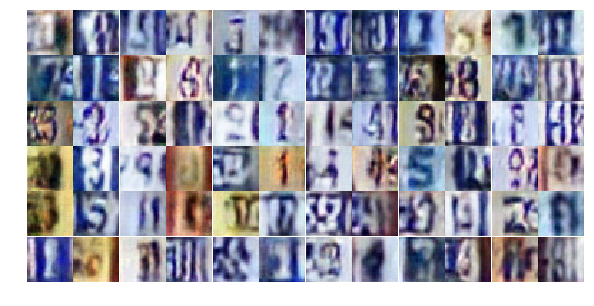

Epoch 11/25... Discriminator Loss: 0.3168... Generator Loss: 2.3208
Epoch 11/25... Discriminator Loss: 0.3232... Generator Loss: 1.8960
Epoch 11/25... Discriminator Loss: 0.2168... Generator Loss: 2.7916
Epoch 11/25... Discriminator Loss: 0.5836... Generator Loss: 1.3119
Epoch 11/25... Discriminator Loss: 0.4350... Generator Loss: 1.4443
Epoch 11/25... Discriminator Loss: 0.2900... Generator Loss: 1.9817
Epoch 11/25... Discriminator Loss: 1.8264... Generator Loss: 0.3568
Epoch 11/25... Discriminator Loss: 4.3854... Generator Loss: 0.0541
Epoch 11/25... Discriminator Loss: 1.0701... Generator Loss: 1.0805
Epoch 11/25... Discriminator Loss: 0.4419... Generator Loss: 1.9684


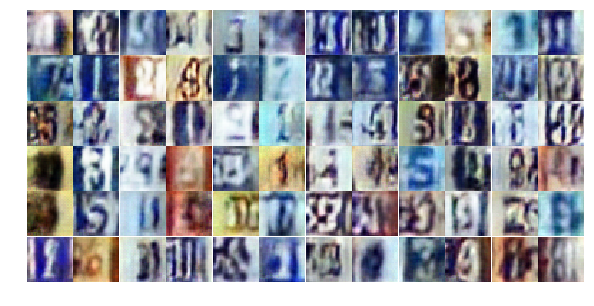

Epoch 11/25... Discriminator Loss: 0.6903... Generator Loss: 1.3226
Epoch 11/25... Discriminator Loss: 0.4510... Generator Loss: 1.7647
Epoch 11/25... Discriminator Loss: 0.5514... Generator Loss: 1.4253
Epoch 11/25... Discriminator Loss: 0.4811... Generator Loss: 1.2881
Epoch 11/25... Discriminator Loss: 0.5288... Generator Loss: 1.3489
Epoch 11/25... Discriminator Loss: 0.8114... Generator Loss: 0.8756
Epoch 11/25... Discriminator Loss: 0.7227... Generator Loss: 0.9598
Epoch 11/25... Discriminator Loss: 0.3072... Generator Loss: 2.5518
Epoch 11/25... Discriminator Loss: 0.5699... Generator Loss: 1.2173
Epoch 11/25... Discriminator Loss: 0.4521... Generator Loss: 1.3980


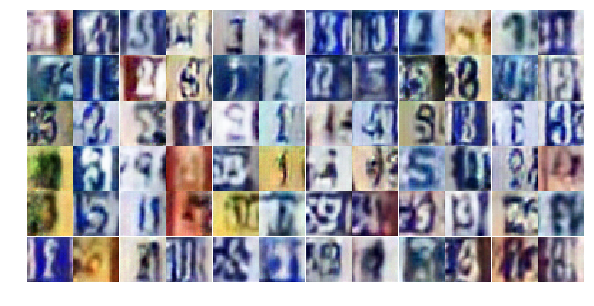

Epoch 12/25... Discriminator Loss: 0.2795... Generator Loss: 3.4351
Epoch 12/25... Discriminator Loss: 0.9098... Generator Loss: 0.7202
Epoch 12/25... Discriminator Loss: 0.7646... Generator Loss: 0.8738
Epoch 12/25... Discriminator Loss: 0.4969... Generator Loss: 1.5248
Epoch 12/25... Discriminator Loss: 0.5106... Generator Loss: 3.1080
Epoch 12/25... Discriminator Loss: 0.5630... Generator Loss: 1.1962
Epoch 12/25... Discriminator Loss: 0.5925... Generator Loss: 1.2730
Epoch 12/25... Discriminator Loss: 0.3114... Generator Loss: 2.2409
Epoch 12/25... Discriminator Loss: 0.5260... Generator Loss: 1.3573
Epoch 12/25... Discriminator Loss: 0.7021... Generator Loss: 1.3083


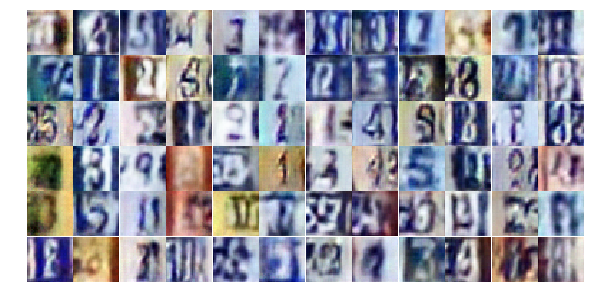

Epoch 12/25... Discriminator Loss: 0.3269... Generator Loss: 1.8359
Epoch 12/25... Discriminator Loss: 0.8177... Generator Loss: 2.7001
Epoch 12/25... Discriminator Loss: 0.3034... Generator Loss: 2.1780
Epoch 12/25... Discriminator Loss: 0.4989... Generator Loss: 3.4673
Epoch 12/25... Discriminator Loss: 0.2755... Generator Loss: 2.6632
Epoch 12/25... Discriminator Loss: 0.7890... Generator Loss: 0.9706
Epoch 12/25... Discriminator Loss: 1.1526... Generator Loss: 0.5031
Epoch 12/25... Discriminator Loss: 0.2202... Generator Loss: 2.3837
Epoch 12/25... Discriminator Loss: 0.5718... Generator Loss: 1.1053
Epoch 12/25... Discriminator Loss: 0.3614... Generator Loss: 1.7232


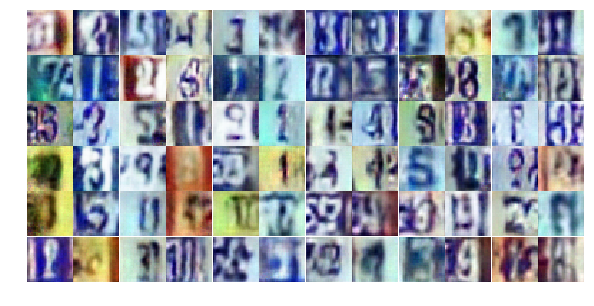

Epoch 12/25... Discriminator Loss: 0.1255... Generator Loss: 3.1760
Epoch 12/25... Discriminator Loss: 0.3537... Generator Loss: 1.5938
Epoch 12/25... Discriminator Loss: 0.3364... Generator Loss: 2.2699
Epoch 12/25... Discriminator Loss: 0.2857... Generator Loss: 2.6290
Epoch 12/25... Discriminator Loss: 0.1430... Generator Loss: 2.6666
Epoch 12/25... Discriminator Loss: 0.1456... Generator Loss: 2.8890
Epoch 12/25... Discriminator Loss: 1.8520... Generator Loss: 0.2940
Epoch 12/25... Discriminator Loss: 0.4179... Generator Loss: 2.1755
Epoch 12/25... Discriminator Loss: 0.6123... Generator Loss: 1.3677
Epoch 12/25... Discriminator Loss: 0.8160... Generator Loss: 0.7762


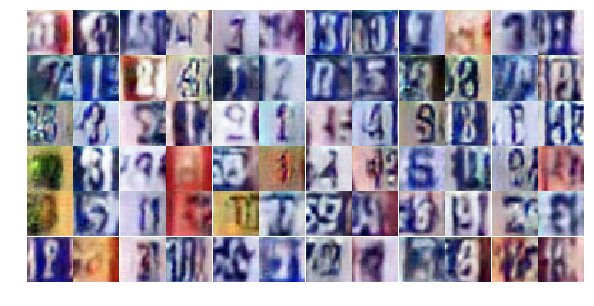

Epoch 12/25... Discriminator Loss: 0.3483... Generator Loss: 1.9100
Epoch 12/25... Discriminator Loss: 0.9202... Generator Loss: 0.7188
Epoch 12/25... Discriminator Loss: 0.8912... Generator Loss: 0.7854
Epoch 12/25... Discriminator Loss: 1.7790... Generator Loss: 0.2690
Epoch 12/25... Discriminator Loss: 0.5038... Generator Loss: 2.8925
Epoch 12/25... Discriminator Loss: 0.2880... Generator Loss: 2.0029
Epoch 12/25... Discriminator Loss: 0.6030... Generator Loss: 1.1362
Epoch 12/25... Discriminator Loss: 0.5377... Generator Loss: 1.6749
Epoch 12/25... Discriminator Loss: 0.3613... Generator Loss: 1.8712
Epoch 12/25... Discriminator Loss: 0.3606... Generator Loss: 1.6636


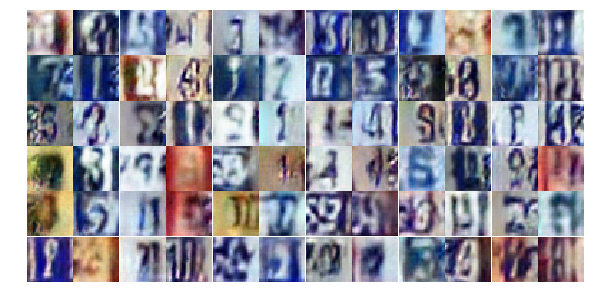

Epoch 12/25... Discriminator Loss: 0.6371... Generator Loss: 1.0097
Epoch 12/25... Discriminator Loss: 0.2985... Generator Loss: 1.7398
Epoch 12/25... Discriminator Loss: 0.3694... Generator Loss: 1.6279
Epoch 12/25... Discriminator Loss: 0.6268... Generator Loss: 1.1352
Epoch 12/25... Discriminator Loss: 0.5857... Generator Loss: 1.1786
Epoch 12/25... Discriminator Loss: 0.5367... Generator Loss: 2.1166
Epoch 12/25... Discriminator Loss: 0.3406... Generator Loss: 1.8524
Epoch 12/25... Discriminator Loss: 0.4826... Generator Loss: 1.5284
Epoch 12/25... Discriminator Loss: 0.4101... Generator Loss: 1.7861
Epoch 12/25... Discriminator Loss: 0.4456... Generator Loss: 1.3845


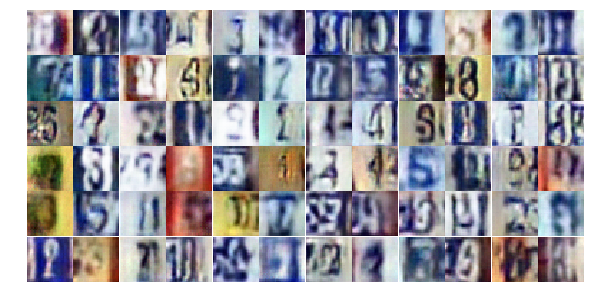

Epoch 12/25... Discriminator Loss: 1.3100... Generator Loss: 0.4442
Epoch 12/25... Discriminator Loss: 0.4834... Generator Loss: 1.2851
Epoch 12/25... Discriminator Loss: 0.7944... Generator Loss: 3.8925
Epoch 12/25... Discriminator Loss: 1.1062... Generator Loss: 0.6720
Epoch 12/25... Discriminator Loss: 0.4609... Generator Loss: 1.2706
Epoch 12/25... Discriminator Loss: 0.5253... Generator Loss: 2.1044
Epoch 12/25... Discriminator Loss: 0.6575... Generator Loss: 1.1049
Epoch 13/25... Discriminator Loss: 0.4241... Generator Loss: 1.6245
Epoch 13/25... Discriminator Loss: 0.3791... Generator Loss: 1.5994
Epoch 13/25... Discriminator Loss: 0.9775... Generator Loss: 0.6344


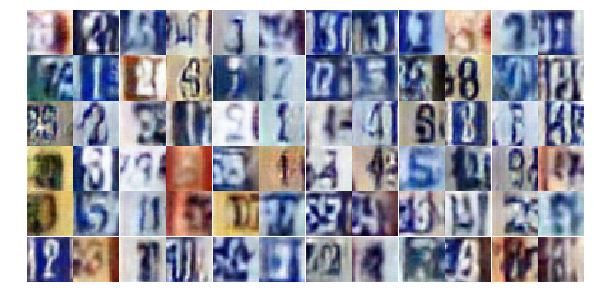

Epoch 13/25... Discriminator Loss: 0.4749... Generator Loss: 1.3487
Epoch 13/25... Discriminator Loss: 0.4061... Generator Loss: 1.4623
Epoch 13/25... Discriminator Loss: 0.4597... Generator Loss: 2.0044
Epoch 13/25... Discriminator Loss: 1.6144... Generator Loss: 0.3401
Epoch 13/25... Discriminator Loss: 0.3660... Generator Loss: 2.3759
Epoch 13/25... Discriminator Loss: 0.3247... Generator Loss: 1.8092
Epoch 13/25... Discriminator Loss: 0.2930... Generator Loss: 2.7181
Epoch 13/25... Discriminator Loss: 0.5718... Generator Loss: 1.1467
Epoch 13/25... Discriminator Loss: 0.3140... Generator Loss: 1.7207
Epoch 13/25... Discriminator Loss: 0.4291... Generator Loss: 1.3543


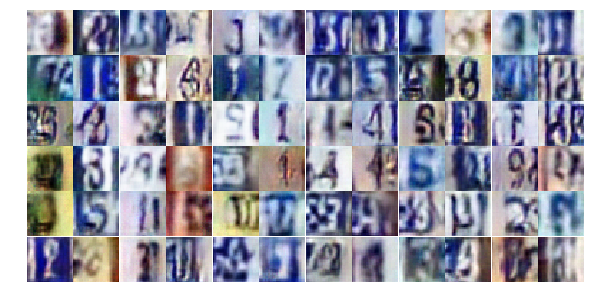

Epoch 13/25... Discriminator Loss: 1.6426... Generator Loss: 4.2892
Epoch 13/25... Discriminator Loss: 1.2922... Generator Loss: 3.9065
Epoch 13/25... Discriminator Loss: 0.6064... Generator Loss: 1.2800
Epoch 13/25... Discriminator Loss: 0.5455... Generator Loss: 1.3430


In [ ]:
dataset = Dataset(trainset, testset)

losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))